<a href="https://colab.research.google.com/github/galrat/parsing/blob/main/!patentability_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# установка пакетов

In [1]:
# установка пакетов

!pip install selenium
!pip install langid
from bs4 import BeautifulSoup
from google.colab import files

from selenium import webdriver
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
from selenium.webdriver.common.by import By
from selenium.webdriver.support import expected_conditions as ec
from selenium.webdriver.support.ui import WebDriverWait

import pandas as pd
import requests
import time

import re
import langid

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.5/10.5 MB 46.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 467.2/467.2 kB 28.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 29.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for langid: filename=langid-1.1.6-py3-none-any.whl size=1941172 sha256=58216ccbb88e0f5b664cd4523ad685c81fe5202e212fad5bbe51bfef17a5821a
  Stored in directory: /root/.cache/pip/wheels/23/c8/c6/eed80894918490a175677414d40bd7c851413bbe03d4856c3c
Successfully built langid


# Что нужно сделать для получения таблицы с патентами:
1. ниже надо ввести номера патентов для парсинга
2. затем нажать ctrl+F9 или выбрать Runtime->Run all в меню сверху

In [2]:
target_country = 'US'
title_filter_presence = []
title_filter_absence =  []
sequence_of_features = [['caterpillars'],
                        ['dirt'],
                        ['cleaning']
]

In [3]:
# original numbers for parsing

numbers = '''CN108564031A
CN105426843A
US10867159B2
US20190278973A1
US11721132B1
US11688204B1
CN106845388A
CN106845388B
CN107046561A
CN106649829A
CN112183504B
CN110879956A
US9928399B2
WO2016019680A2
CN110097006A
CN113989966A
CN109460746B
US8457370B2
CN112200119A
CN112016516A
CN112241710A
CN109447052A
CN110248025A
CN108241841A
CN114241534A
CN114241535A
CN114241535B
CN113221891B
CN113221891A
CN112308044B
CN112381042A
CN112052842A
US20050286744A1
US7580552B2
US20110017769A1
CN112132099A
CN111462379A
CN116524549A
CN116229528A
CN108806007A
CN114821682A
CN114821682B
CN114863499B
CN107832739A
CN108427942A
CN108537203A
CN111160290A
CN111160290B
CN111696228A
US7660442B2
CN108960125A
CN111639562A
CN112200159B
US8135181B2
US8229178B2
US20120194662A1
US20050281438A1
US20040264742A1
US7496214B2
CN107066988A
CN107944356A
US8781177B2
US11847856B2
CN106296905A
CN105678393A
CN107242875A
CN109512436A
CN108509945A
CN109033981A
CN105809142A
CN113033429A
CN113435377A
CN108647672A
CN107909004A
US11587363B2
US10895980B2
CN113673343A
CN117133027A
CN117133027B
CN112232332A
CN112232332B
CN110598522A
CN110580783A
CN110598661A
CN115457602A
CN106372611A
US20170277944A1
CN109359607A
US10872225B2
US11461955B2
CN112200124A
CN115546848A
US20120057763A1
CN102609697A
CN106228151B
US20030118215A1
CN114155296A
CN115273282A
CN116620219A
CN116620219B
KR102577276B1
CN105224906B
WO2022037029A1
WO2021128433A1
KR102375593B1
CN116805359A
KR100364388B1
WO2023063853A1
WO2018090402A1
WO2023075183A1
KR20020061375A
WO2004029862A1
WO2024016167A1
WO2004111919A1
WO2017116331A1
WO2020228279A1
RU2761776C1
RU2788590C1
RU2772040C1
RU173901U1
CN110321870B
CN104537338A
CN104537338B
CN114140424B
CN110245669A
CN110349096A
CN110147730A
CN110287772A
CN104636721B
CN109960963A
US11380138B2
US10303865B2
CN110046905A
CN115100696A
CN105184216A
CN111738076A
CN107358185B
CN111368747A
CN112241720A
CN112069928B
CN106548134A
CN113780122A
CN104318213A
CN104268542B
CN108416338A
CN108416338B
CN111832487A
CN106980828B
CN105701513B
CN105701473B
CN107341473A
CN107341473B
CN107239772A
CN107239772B
CN113901940A
CN107122700A
CN104615635A
CN111242936A
CN107862249A
CN113515987B
CN106056041A
CN106355825A
CN106250823A
CN108960003A
CN109977915B
CN111582228A
CN110414373B
CN109345553A
CN107016323A
CN114373195A
CN114943994A
CN111274924A
CN112364805A
CN104951940A
CN104809446A
CN104392225A
CN104392455A
CN107506688A
CN107506688B
CN105095854A
CN107292273B
CN104392455B
CN108427945A
CN109190603A
CN107195124A
CN105844261A
CN106022218A
CN105426821B
CN106022218B
CN113609953A
CN111160246A
'''


# основной код

## defs

In [4]:
def get_all_claims(soup):
  claims = soup.find('div', class_='layout horizontal style-scope patent-text').text
  return claims

In [5]:
def separate_languages(text):
    sentences = text.split('.')  # You can use a more sophisticated sentence tokenizer based on your text

    english_text = []
    other_languages_text = []

    for sentence in sentences:
        # Use langid to identify the language of each sentence
        lang, confidence = langid.classify(sentence)

        if lang == 'en':
            english_text.append(sentence)
        else:
            other_languages_text.append(sentence)

    return ' '.join(english_text)

In [6]:
def get_data_from_google_patent(url, target_country):
  options = Options()
  options.add_argument("--headless")
  options.add_argument('--no-sandbox')
  options.add_argument('--user-agent=Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/92.0.4515.131 Safari/537.36')
  driver = webdriver.Chrome(options=options)
  driver.get(url)
  WebDriverWait(driver, 20).until(ec.visibility_of_element_located((By.ID, 'content')))
  soup = BeautifulSoup(driver.page_source, 'lxml')

  # find US, EP, WO patent document

  others = soup.find('div', class_='event style-scope application-timeline')
  text = others.find_all(class_='style-scope application-timeline')[0]
  other_apps = ''
  for t in others.find_all(class_='style-scope application-timeline'):
      try:
        other_apps += t.get('data-result').split('patent/')[1].split('/')[0] + ','
      except:
        other_apps = other_apps
  print('other_apps', other_apps)

  if target_country not in url:
    new_app = ''
    for app_number in other_apps.split(','):
      #print('app_number', app_number)
      if 'US' in app_number:
        new_app = app_number
        break
      if 'EP' in app_number:
        new_app = app_number
        #break
      if 'WO' in app_number:
        new_app = app_number
        #break
    if new_app != '':
      url = 'https://patents.google.com/patent/' + new_app + '/en'
      print('new_url', url)
      options = Options()
      options.add_argument("--headless")
      options.add_argument('--no-sandbox')
      options.add_argument('--user-agent=Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/92.0.4515.131 Safari/537.36')
      driver = webdriver.Chrome(options=options)
      driver.get(url)
      WebDriverWait(driver, 20).until(ec.visibility_of_element_located((By.ID, 'content')))
      soup = BeautifulSoup(driver.page_source, 'lxml')
    else:
      print('url is not changed since no US, EP, WO is detected', url)
  else:
    print('url is not changed since it is target')

  # title
  title = soup.find('div', id='wrapper').find('h1', id='title').text.replace('\n', '').strip()
  #print('title:', title)

  # patent_number
  patent_number = soup.find('h2', id='pubnum').text.strip().replace('\n', '').replace('\t', '')
  #print('patent_number:', patent_number)

  # applicant
  author_counter = 0
  applicant_counter = 0
  counter = 0
  author_check = 0
  applicant_check = 0
  important_people_data = soup.find('dl', class_='important-people style-scope patent-result')
  for i in important_people_data.find_all('dt', class_='style-scope patent-result'):
      if 'Inventor' in i.text:
          author_counter = counter
          author_check = 1
      if 'assignee' in i.text:
          applicant_counter = counter
          applicant_check = 1
      counter += 1
  #print('author_counter', author_counter, 'applicant_counter', applicant_counter)

  authors = ''
  if author_check == 1:
      try:
          authors_data = soup.find('dl', class_='important-people style-scope patent-result')
          authors_data = authors_data.find_all('dt', class_='style-scope patent-result')[
              author_counter].find_next_siblings('dd')
          for author in authors_data:
              if '\n' in author.text:
                  break
              authors = authors + author.text + ';'
          authors = authors.replace('\n', '')
      except:
          #print('no authors data')
          authors = ('no authors data')
  else:
      authors = 'no_data'

  applicants = ''
  if applicant_check == 1:
      try:
          applicants_data = soup.find('dl', class_='important-people style-scope patent-result')
          applicants_data = applicants_data.find_all('dt', class_='style-scope patent-result')[
              applicant_counter].find_next_siblings('dd')
          for applicant in applicants_data:
              applicants = applicants + applicant.text.strip() + ';'
          applicants = applicants.replace('\n', '').strip()
      except:
          #print('no applicants data')
          applicants = ('no applicants data')
  else:
      applicants = 'no_data'

  # filing_date
  filind_date = 'no_data'
  publication_date = 'no_data'
  status = 'no_data'
  dates_data = soup.find_all('div', class_='event layout horizontal style-scope application-timeline')
  for data in dates_data:
      if 'filed by' in data.text:
          filind_date = data.text.split('Application')[0]
          #print('filing date:', filind_date)
      if 'Publication' in data.text:
          publication_date = data.text.split('Publication')[0]
          #print('publication date:', publication_date)
      if 'Status' in  data.text:
          status = data.text.split('Status')[1].replace('\n', '').replace('\t', '')
          #print('Status:', status)

  # application number
  try:
      application_number = soup.find_all('div', class_='header style-scope application-timeline')[1].text
      application_number = application_number.split('Application')[1].split('events')[0].replace(' ','')
  except:
      print('no application number data')
      application_number = 'no data'
  #print('application_number', application_number)

  # get priority applications
  priority_applications = ''
  for i in soup.find('div', class_='wrap style-scope application-timeline').find_all('div', class_='event layout horizontal style-scope application-timeline'):
    try:
      priority_applications += i.text.split('Priority to')[1].strip() + ';'
      #print(i.text.split('Priority to')[1].strip())
    except:
      no_priority = 1
  if priority_applications == '':
    priority_applications = 'no_data'

  # ipc
  ipc_data = 'no_data'
  try:
      ipcs = soup.find('div', class_='style-scope classification-viewer').find_all('div', class_='style-scope classification-tree')
      for ipc in ipcs:
          ipc_class = ipc.find(first=True).text.strip().replace('\n', '').replace('\t', '')
          #print('ipc', ipc_class)
      #print(ipc_class)
  except:
      ipc_data = 'no_data'

  ipc_datas = soup.find_all('div', class_='style-scope classification-tree')
  for i in ipc_datas[:1]:
      target = i.find_all(class_='code style-scope classification-tree')
      #print('target ipc', target[-1].text)
      # print(i.text.strip())
      ipc_data = target[-1].text

  # all claims
  claims = ''
  try:
    claims = soup.find('section', id='claims').text.strip()
    #print('claims google', claims)
  except:
    print('no claims')

  # descrition
  description = ''
  try:
    description = soup.find('section', id='description').text.strip().replace('\n\n', '\n')
    #print('descrition google', description)
  except:
    print('no description')

  # abstract
  abstract = ''
  try:
    abstract_orig = soup.find('section', id='abstract').find('span', class_='google-src-text style-scope patent-text').text#.text.replace('\n', '').replace('\t', '').replace('Abstracttranslated from ', '')
    #print('abstract_orig', abstract_orig)
    abstract_all = soup.find('section', id='abstract').text
    #print('abstract_all', abstract_all)
    abstract_eng = abstract_all.replace(abstract_orig, '').strip()
    abstract_eng = abstract_eng.replace('\n', '')
    #print('abstract_eng', abstract_eng)
    abstract = abstract_eng
  except:
    abstract = soup.find('section', id='abstract').text.replace('\n', '').replace('\t', ' ')


  # set 'printing = 1' to show info
  printing = 0
  if printing:
      print('patent_number:', patent_number)
      print('application_number:', application_number)
      print('title:', title)
      print('priority_applications:', priority_applications)
      print('filind_date:', filind_date)
      print('applicant:', applicants)
      print('authors:', authors)
      print('ipc_data:', ipc_data)
      print('publication_date:', publication_date)
      print('abstract:', abstract)
      print('claims:', claims)
      print('status:', status)
      print('others:', other_apps)
      print('description', description)


  header = ['patent number', 'application_number', 'title', 'INV/UM', 'filing_date', 'applicant', 'autors',
                          'publiction_date', 'ipc', 'claims', 'status', 'abstract', 'other_applications', 'description']
  data_line = []
  data_line.append(patent_number)
  data_line.append(application_number)
  data_line.append(title)
  data_line.append(priority_applications)
  data_line.append(filind_date)
  data_line.append(applicants)
  data_line.append(authors)
  data_line.append(publication_date)
  data_line.append(ipc_data)
  data_line.append(claims.replace('\n', ''))
  data_line.append(status)
  data_line.append(abstract.replace('\n', ''))
  #data_line.append(others[:-1])
  data_line.append(other_apps)
  data_line.append(description)

  # =========================================================================================
  # data from the bottom reagrding similar patents

  add_patents = soup.find('div', class_='footer style-scope patent-result').find_all('div', class_='responsive-table style-scope patent-result')[0].find_all('div', class_='tr style-scope patent-result')
  patent_lines = []
  for patent in add_patents:
    patent_line = []
    for line in patent.find_all('span'):
      #print(line.text.replace('*', '').strip())
      patent_line.append(line.text.replace('*', '').strip())
      #print('---------------------')
    #print(patent.find('span'))
    patent_lines.append(patent_line)
    #print('===========================')
    #break

  add_patents = soup.find('div', class_='footer style-scope patent-result').find_all('div', class_='responsive-table style-scope patent-result')[1].find_all('div', class_='tr style-scope patent-result')
  for patent in add_patents:
    patent_line = []
    for line in patent.find_all('span'):
      #print(line.text.replace('*', '').strip())
      patent_line.append(line.text.replace('*', '').strip())
      #print('---------------------')
    #print(patent.find('span'))
    if len(patent_line) == 3:
      patent_line.insert(1, 'no_data')
      patent_line.insert(3, 'no_data')
    patent_lines.append(patent_line)
    #print('===========================')
    #break

  add_patents = soup.find('div', class_='footer style-scope patent-result').find_all('div', class_='responsive-table style-scope patent-result')[2].find_all('div', class_='tr style-scope patent-result')
  for patent in add_patents:
    patent_line = []
    for line in patent.find_all('span'):
      #print(line.text.replace('*', '').strip())
      patent_line.append(line.text.replace('*', '').strip())

      #print('---------------------')
    #print(patent.find('span'))
    if len(patent_line) == 3:
      patent_line.insert(1, 'no_data')
      patent_line.insert(3, 'no_data')
    patent_lines.append(patent_line)
    #print('===========================')
    #break

  # get data for espacenet
  all_additional_urls = [url.get('href') for url in soup.find('dl', class_='links style-scope patent-result').findAll('a')]
  bottom_data = patent_lines

  return data_line, bottom_data, all_additional_urls


In [7]:
def get_patent_data(numbers, bottom_data_file):
  numbers = numbers.replace('-', '')
  all_numbers = numbers.split()
  print('lenght of all_numbers:', len(all_numbers))

  # проверка, какие номера патентов еще не спарсены
  file_for_saving_results = "/content/saved_data.txt"

  header_2 = ['patent number', 'application_number', 'title', 'priority applications', 'filing_date', 'applicant', 'authors',
                              'publiction_date', 'ipc', 'claims', 'status', 'abstract', 'other_applications', 'description']
  try:
      saved_data = pd.read_csv(file_for_saving_results, sep='\t')
      parsed_numbers = saved_data['original_number'].values
      #print('parsed_numbers', parsed_numbers)
  except:
      parsed_numbers = []
      with open(file_for_saving_results, 'a', encoding="utf-8") as file:
          file.writelines('\t'.join(['original_number'] + header_2) + '\n')
      print("creating new file")

  remaining_numbers = list(set(all_numbers) - set(parsed_numbers))
  print('remaining_numbers', remaining_numbers)
  print('total remaining', len(remaining_numbers))

  # correct app_numbers
  remaining_numbers_corrected = []
  for number in remaining_numbers:
      if number[:2] == 'WO' and len(number) == 12:
          number = 'WO20' + number[2:] + '/en'
      remaining_numbers_corrected.append(number)

  final_urls = []
  for app_num in remaining_numbers_corrected:
    if app_num[:3] == 'US2' and len(app_num) == 14:
        url =  app_num[:].replace('-', '')[:6] + '0' + app_num[:].replace('-', '')[6:] + '/en'
        url = 'https://patents.google.com/patent/' + url
        print('corrected url', url)
    else:
        url = 'https://patents.google.com/patent/' + app_num[:].replace('-', '').replace('\n', '') + '/en'
        print('url', url)
    final_urls.append(url)

  print('final_urls', final_urls)

  # результаты

  # get data by url
  print('\nstart of parsing')
  counter = 1
  parsed_data=[]
  wrong_numbers = []
  bottom_data = []
  espacenet_urls = []
  for original_number, url in zip(remaining_numbers, final_urls[:]):
    try:
      print(counter, '/', len(remaining_numbers))
      counter += 1
      print(url)
      data_line_google = get_data_from_google_patent(url, target_country)

      print('data_line_google[0]', data_line_google[0])
      print('data_line_google[1]', data_line_google[1])
      bottom_data += data_line_google[1]

      # get espacenet url
      all_additional_urls = data_line_google[2]

      parsed_data.append(data_line_google[0])
      with open(file_for_saving_results, 'a', encoding="utf-8") as file:
          file.writelines('\t'.join([original_number] + data_line_google[0]) + '\n')
          print('writing')
    except:
      wrong_numbers.append(original_number)
      print('smth wrong')


    print()
    #break
  print('====================finish=========================')
  print('wrong_numbers which shall be reparsed', wrong_numbers)

  # download the created file
  #files.download(file_for_saving_results)
  bottom_data_2 = []

  for line in bottom_data[1:]:
    if len(line) == 5 and 'Family To Family Citations' not in line[0] and 'Priority date' not in line[1]:
      bottom_data_2.append(line)

  bottom_data_df = pd.DataFrame(bottom_data_2[0:], columns=['publication number', 'Priority date', 'publication date',  'assignee',  'title'])
  bottom_data_df.to_csv(bottom_data_file)
  #print(bottom_data_df)
  #files.download('bottom_data.csv')

  return parsed_data, bottom_data_df

## code

In [8]:
# первый этап, на котором парсятся номера патентов и собираются данные из bottom part (cited, citing, similar)
bottom_data_file = '/content/bottom_data_step_1.txt'
parsing_result = get_patent_data(numbers, bottom_data_file)
first_parsing_df = pd.DataFrame(parsing_result[0])


#first_step_data = pd.read_csv('/content/saved_data.txt', sep='\t')
print('количество документов на первом этапе', len(first_parsing_df))



lenght of all_numbers: 191
creating new file
remaining_numbers ['CN106980828B', 'CN113033429A', 'CN116805359A', 'CN111160290A', 'CN107066988A', 'CN110598661A', 'CN109359607A', 'CN104615635A', 'CN114241534A', 'CN107292273B', 'CN108241841A', 'CN117133027B', 'CN110287772A', 'US9928399B2', 'CN112183504B', 'CN110879956A', 'CN111368747A', 'CN111738076A', 'CN108806007A', 'KR100364388B1', 'CN102609697A', 'CN108427945A', 'KR102577276B1', 'WO2020228279A1', 'US10895980B2', 'CN114140424B', 'CN104318213A', 'CN104392225A', 'CN109960963A', 'CN117133027A', 'CN106296905A', 'CN114155296A', 'CN116524549A', 'WO2023075183A1', 'CN107862249A', 'CN104268542B', 'CN109512436A', 'US20110017769A1', 'CN107909004A', 'CN113901940A', 'CN112200124A', 'CN109447052A', 'CN110248025A', 'CN113673343A', 'CN110097006A', 'CN110147730A', 'CN106228151B', 'CN109977915B', 'US11688204B1', 'CN106355825A', 'CN105095854A', 'CN104537338A', 'CN107239772B', 'US20040264742A1', 'CN107195124A', 'CN106022218A', 'CN107242875A', 'WO2017116331

In [9]:
columns = ['patent number', 'application_number', 'title', 'priority applications', 'filing_date', 'applicant', 'authors', 'publiction_date', 'ipc', 'claims', 'status', 'abstract', 'other_applications', 'description']
first_step_parsing_df = pd.DataFrame(parsing_result[0], columns=columns)
first_step_parsing_df

,patent number,application_number,title,priority applications,filing_date,applicant,authors,publiction_date,ipc,claims,status,abstract,other_applications,description
0,CN106980828B,CN201710160957.6A,"Method, device and equipment for determining p...",CN201710160957.6A;,2017-03-17,"SHENZHEN WEICHAO INTELLIGENT TECHNOLOGY Co.,Ltd.;",章鸿润;,2020-06-19,G06F3/017,Claims (10) Hide Dependen...,Active,Abstracttranslated from The invention relates ...,"CN106980828B,",Description\ntranslated from \n\n\n\n\n\nMetho...
1,CN113033429A,CN202110340189.9A,Palm and palm type palm vein feature extractio...,CN202110340189.9A;,2021-03-30,Individual;,聂为清;聂一晓;,2021-06-25,G06V40/10,Claims (3) Hide Dependent...,Pending,Abstracttranslated from The invention disclose...,"CN113033429A,",Description\ntranslated from \n\n\n\n\n\nPalm ...
2,WO2023174317A1,PCT/CN2023/081535,Method and apparatus for acquiring biometric f...,no_data,2023-03-15,no_data,杨春林;周军;,2023-09-21,G06V10/145,Claims (15) Hide Dependen...,no_data,Abstracttranslated from A method and apparatus...,"CN116805359A,WO2023174317A1,",Description\ntranslated from \n\n\n\n\n\n 手掌生物...
3,CN111160290A,CN201911415308.1A,Method for extracting effective region of palm...,CN201911415308.1A;,2019-12-31,Guangzhou Wedone Technology Co ltd;,陈建昌;尹嘉;房雪雁;郑权;李立龙;,2023-09-01,G06V40/10,Claims (8) Hide Dependent...,Active,Abstracttranslated from The invention provides...,"CN111160290B,",Description\ntranslated from \n\n\n\n\n\nMetho...
4,CN107066988A,CN201710300824.4A,A kind of palm infrared body temperature measu...,CN201710300824.4A;,2017-05-02,Hunan Datuo 3d Digital Technology Co Ltd;,陈宇拓;梅旺;王磊;,2017-08-18,G06V40/10,Claims (5) Hide Dependent...,Pending,Abstracttranslated from The invention disclose...,"CN107066988A,",Description\ntranslated from \n\n\n\n\n\nA kin...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
185,CN107944356A,CN201711112321.0A,The identity identifying method of the hierarc...,CN201711112321.0A;,2017-11-13,Hunan University of Technology;,陈荣元;周鲜成;徐雪松;余绍黔;申立智;陈浪;,2019-02-19,G06V40/1347,Claims (5) Hide Dependent...,Active,Abstracttranslated from A kind of identity ide...,"CN107944356B,",Description\ntranslated from \n\n\n\n\n\nIdent...
186,CN107239772A,CN201710492250.5A,Palm print and palm vein image collecting devi...,CN201710492250.5A;,2017-06-23,"Shenzhen Zhong Zhi Intelligent Technology Co.,...",张大鹏;梁旭;骆南;卢光明;刘旸;,2018-10-16,G06V40/13,Claims (14) Hide Dependen...,Expired - Fee Related,Abstracttranslated from The present invention ...,"CN107239772B,",Description\ntranslated from \n\n\n\n\n\nPalm ...
187,WO2004111919A1,PCT/CN2004/000631,Method of palm print identification,JP2006515633A;,2004-06-11,no_data,Dapeng David Zhang;Jia Jane You;Wai Kin Adams ...,2004-12-23,G06V40/11,Claims () Hide Dependent ...,no_data,Abstracttranslated from A method of biometrics...,"WO2004111919A1,JP2007524143A,",Description\ntranslated from \n\n\n\n\n\n METH...
188,US11721132B1,"US17/587,331",System and method for generating region of int...,"US17/587,331;",2022-01-28,Armatura LLC;,Zhinong LI;Xiaowu Zhang;,2023-08-08,G06V40/45,Claims (24) Hide Dependen...,Active,Abstracttranslated from The present teaching r...,"US11721132B1,",Description\ntranslated from \n\n\n\n\n\nCROSS...


In [10]:
already_parsed = first_step_parsing_df['patent number'].values

In [11]:
cited_df = pd.DataFrame(parsing_result[1])
cited_df

,publication number,Priority date,publication date,assignee,title
0,CN102163282A,2011-05-05,2011-08-24,汉王科技股份有限公司,Method and device for acquiring interested are...
1,EP2374089A1,2008-12-30,2011-10-12,Nokia Corp.,"Method, apparatus and computer program product..."
2,CN103984928A,2014-05-20,2014-08-13,桂林电子科技大学,Finger gesture recognition method based on fie...
3,CN105825193A,2016-03-25,2016-08-03,乐视控股（北京）有限公司,Method and device for position location of cen...
4,CN105938549A,2016-06-08,2016-09-14,大连民族大学,Palm print ROI segmentation method in palm pri...
...,...,...,...,...,...
5795,Mo et al.,no_data,2019,no_data,Off-line handwritten signature recognition bas...
5796,Andono et al.,no_data,2018,no_data,Bag-of-visual-words model for fingerprint clas...
5797,Pokhriyal et al.,no_data,2010,no_data,MERIT: Minutiae Extraction using Rotation Inva...
5798,Sonkar et al.,no_data,2022,no_data,Iris recognition using transfer learning of in...


In [12]:
# обработка bottom file
df = cited_df
print('исходное количество bottom patents:', len(df))

df = df.drop_duplicates(['publication number'], keep='first')
df = df.dropna()
filtered_df = df[~df['publication number'].isin(already_parsed)]
print('первый этап фильтрации (drop_duplicates, dropna, drop already parsed)', len(filtered_df))

number_stop_words = [' et al.'] # to delete articles and save patents
#filtered_df = filtered_df[filtered_df['title'].str.contains('|'.join(title_filter_presence), case=False) & ~filtered_df['title'].str.contains('|'.join(title_filter_absence), case=False)]
filtered_df = filtered_df[~filtered_df['publication number'].str.contains('|'.join(number_stop_words), case=False)]
print('второй этап фильтрации (по ключевым словам в названии)', len(filtered_df))
#print(filtered_df[['publication number', 'title']])
print('отфильтрованы (исключены)', set(df['publication number'].values) - set(filtered_df['publication number'].values))
print()

pattern = r'^[A-Z]{2}'
filtered_df = filtered_df[filtered_df['publication number'].str.match(pattern)]
print(len(filtered_df))
#filtered_df['publication date'] = pd.to_datetime(filtered_df['publication date'])

filtered_df = filtered_df.sort_values('title', ascending=True)
#for i in range(len(filtered_df)):
  #print(filtered_df.iloc[i][['title']].values)

second_step_numbers = '\n'.join(filtered_df['publication number'].values)
#print('третий этап фильтрации (только целевая страна, только подходящая дата)', len(filtered_df['publication number'].values), '\n', second_step_numbers)


исходное количество bottom patents: 5800
первый этап фильтрации (drop_duplicates, dropna, drop already parsed) 4130
второй этап фильтрации (по ключевым словам в названии) 3719
отфильтрованы (исключены) {'Peng et al.', 'Kaur et al.', 'Okafor et al.', 'Zhong et al.', 'Kumar et al.', 'CN113033429A', 'Jiang et al.', 'Potdar et al.', 'Karimi et al.', 'Sapkale et al.', 'CN109359607A', 'Sepasian et al.', 'CN117133027B', 'CN110287772A', 'Javidnia et al.', 'CN112183504B', 'Angadi et al.', 'Parada et al.', 'Kang et al.', 'Schnieders et al.', 'Suetake et al.', 'Han et al.', 'CN104392225A', 'Shweta et al.', 'CN109960963A', 'CN117133027A', 'CN114155296A', 'Mehboob et al.', 'CN104268542B', 'CN109512436A', 'Cheheb et al.', 'Feng et al.', 'Deshpande et al.', 'Dvořák et al.', 'Sudhamani et al.', 'Haddad et al.', 'CN110248025A', 'Kowsigan et al.', 'CN109447052A', 'Joshi et al.', 'Duffner et al.', 'Dale et al.', 'CN109977915B', 'CN106355825A', 'US20040264742A1', 'CN107242875A', 'Hiew et al.', 'Abd Warif 

In [13]:
second_step_for_parsing = '\n'.join(filtered_df['publication number'].values)

In [14]:
for i in '\n'.join(filtered_df['publication number'].values).split('\n'):
  print(i)

CN2021105193994
CN202210256546.8
JP2006129083A5
KR10-2021-0143392
CN202110519399
JP2018150043A5
EP1743280A2
CN106773080A
US20060120576A1
CN112102221A
CN110718008A
CN107609383B
CN107748869B
CN107748869A
CN107633165A
CN110472582B
US9117105B2
CN110298273B
US11086476B2
EP2413263A1
KR101720957B1
EP3073414A1
EP3073414B1
CN101449288A
CN110298273A
CN109637664A
CN103345755B
CN107292217A
CN109447172A
CN106874824A
CN206249454U
CN108270914A
CN106780460A
CN107958242A
CN109670471A
CN106951873A
CN110223312A
CN108492301A
CN106355972B
CN106950695A
CN109410233A
CN106203593A
CN107122210A
CN109523013A
CN207008642U
CN108597003A
CN104952121B
CN106993117A
CN104867225B
CN109886060A
CN204204058U
CN109933984A
CN106529504B
CN107038445A
CN108877007A
CN108564017A
CN109858439A
CN110264531A
CN106156739B
CN107564006A
CN206696653U
CN110232719A
CN107230271A
CN207637211U
CN107146215A
CN208607673U
CN107731306A
CN208938124U
CN108491464A
CN206224477U
CN109800677A
CN110414373A
CN109977780A
CN109426825A
CN110414330A
CN110378

In [15]:
second_step_numbers = second_step_for_parsing[:5] # здесь надо убрать 55
second_step_numbers

'CN202'

In [16]:
# второй этап, на котором парсятся данные по номерам патентов из bottom part после первого парсинга

bottom_data_file_empty = '/content/bottom_data_step_empty.txt' # второй bottom data файл не используется, но его нужно указать
#print(second_step_numbers)
parsing_result_2 = get_patent_data(second_step_numbers, bottom_data_file_empty)


lenght of all_numbers: 1
creating new file
remaining_numbers ['CN202']
total remaining 1
url https://patents.google.com/patent/CN202/en
final_urls ['https://patents.google.com/patent/CN202/en']

start of parsing
1 / 1
https://patents.google.com/patent/CN202/en
smth wrong

====================finish=========================
wrong_numbers which shall be reparsed ['CN202']


In [ ]:
second_step_parsing_df = pd.DataFrame(parsing_result_2[0], columns=columns)
second_step_parsing_df

In [18]:
# получаю большой df, оставляю в нем только номер, описание. Анализирую описание, чтобы найти абзацы с ключевыми словами. ключевые слова должны быть с OR и с AND.

In [19]:
first_step_parsing_df

,patent number,application_number,title,priority applications,filing_date,applicant,authors,publiction_date,ipc,claims,status,abstract,other_applications,description
0,CN106980828B,CN201710160957.6A,"Method, device and equipment for determining p...",CN201710160957.6A;,2017-03-17,"SHENZHEN WEICHAO INTELLIGENT TECHNOLOGY Co.,Ltd.;",章鸿润;,2020-06-19,G06F3/017,Claims (10) Hide Dependen...,Active,Abstracttranslated from The invention relates ...,"CN106980828B,",Description\ntranslated from \n\n\n\n\n\nMetho...
1,CN113033429A,CN202110340189.9A,Palm and palm type palm vein feature extractio...,CN202110340189.9A;,2021-03-30,Individual;,聂为清;聂一晓;,2021-06-25,G06V40/10,Claims (3) Hide Dependent...,Pending,Abstracttranslated from The invention disclose...,"CN113033429A,",Description\ntranslated from \n\n\n\n\n\nPalm ...
2,WO2023174317A1,PCT/CN2023/081535,Method and apparatus for acquiring biometric f...,no_data,2023-03-15,no_data,杨春林;周军;,2023-09-21,G06V10/145,Claims (15) Hide Dependen...,no_data,Abstracttranslated from A method and apparatus...,"CN116805359A,WO2023174317A1,",Description\ntranslated from \n\n\n\n\n\n 手掌生物...
3,CN111160290A,CN201911415308.1A,Method for extracting effective region of palm...,CN201911415308.1A;,2019-12-31,Guangzhou Wedone Technology Co ltd;,陈建昌;尹嘉;房雪雁;郑权;李立龙;,2023-09-01,G06V40/10,Claims (8) Hide Dependent...,Active,Abstracttranslated from The invention provides...,"CN111160290B,",Description\ntranslated from \n\n\n\n\n\nMetho...
4,CN107066988A,CN201710300824.4A,A kind of palm infrared body temperature measu...,CN201710300824.4A;,2017-05-02,Hunan Datuo 3d Digital Technology Co Ltd;,陈宇拓;梅旺;王磊;,2017-08-18,G06V40/10,Claims (5) Hide Dependent...,Pending,Abstracttranslated from The invention disclose...,"CN107066988A,",Description\ntranslated from \n\n\n\n\n\nA kin...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
185,CN107944356A,CN201711112321.0A,The identity identifying method of the hierarc...,CN201711112321.0A;,2017-11-13,Hunan University of Technology;,陈荣元;周鲜成;徐雪松;余绍黔;申立智;陈浪;,2019-02-19,G06V40/1347,Claims (5) Hide Dependent...,Active,Abstracttranslated from A kind of identity ide...,"CN107944356B,",Description\ntranslated from \n\n\n\n\n\nIdent...
186,CN107239772A,CN201710492250.5A,Palm print and palm vein image collecting devi...,CN201710492250.5A;,2017-06-23,"Shenzhen Zhong Zhi Intelligent Technology Co.,...",张大鹏;梁旭;骆南;卢光明;刘旸;,2018-10-16,G06V40/13,Claims (14) Hide Dependen...,Expired - Fee Related,Abstracttranslated from The present invention ...,"CN107239772B,",Description\ntranslated from \n\n\n\n\n\nPalm ...
187,WO2004111919A1,PCT/CN2004/000631,Method of palm print identification,JP2006515633A;,2004-06-11,no_data,Dapeng David Zhang;Jia Jane You;Wai Kin Adams ...,2004-12-23,G06V40/11,Claims () Hide Dependent ...,no_data,Abstracttranslated from A method of biometrics...,"WO2004111919A1,JP2007524143A,",Description\ntranslated from \n\n\n\n\n\n METH...
188,US11721132B1,"US17/587,331",System and method for generating region of int...,"US17/587,331;",2022-01-28,Armatura LLC;,Zhinong LI;Xiaowu Zhang;,2023-08-08,G06V40/45,Claims (24) Hide Dependen...,Active,Abstracttranslated from The present teaching r...,"US11721132B1,",Description\ntranslated from \n\n\n\n\n\nCROSS...


In [20]:
merged_df = pd.concat([first_step_parsing_df, second_step_parsing_df])

merged_df

,patent number,application_number,title,priority applications,filing_date,applicant,authors,publiction_date,ipc,claims,status,abstract,other_applications,description
0,CN106980828B,CN201710160957.6A,"Method, device and equipment for determining p...",CN201710160957.6A;,2017-03-17,"SHENZHEN WEICHAO INTELLIGENT TECHNOLOGY Co.,Ltd.;",章鸿润;,2020-06-19,G06F3/017,Claims (10) Hide Dependen...,Active,Abstracttranslated from The invention relates ...,"CN106980828B,",Description\ntranslated from \n\n\n\n\n\nMetho...
1,CN113033429A,CN202110340189.9A,Palm and palm type palm vein feature extractio...,CN202110340189.9A;,2021-03-30,Individual;,聂为清;聂一晓;,2021-06-25,G06V40/10,Claims (3) Hide Dependent...,Pending,Abstracttranslated from The invention disclose...,"CN113033429A,",Description\ntranslated from \n\n\n\n\n\nPalm ...
2,WO2023174317A1,PCT/CN2023/081535,Method and apparatus for acquiring biometric f...,no_data,2023-03-15,no_data,杨春林;周军;,2023-09-21,G06V10/145,Claims (15) Hide Dependen...,no_data,Abstracttranslated from A method and apparatus...,"CN116805359A,WO2023174317A1,",Description\ntranslated from \n\n\n\n\n\n 手掌生物...
3,CN111160290A,CN201911415308.1A,Method for extracting effective region of palm...,CN201911415308.1A;,2019-12-31,Guangzhou Wedone Technology Co ltd;,陈建昌;尹嘉;房雪雁;郑权;李立龙;,2023-09-01,G06V40/10,Claims (8) Hide Dependent...,Active,Abstracttranslated from The invention provides...,"CN111160290B,",Description\ntranslated from \n\n\n\n\n\nMetho...
4,CN107066988A,CN201710300824.4A,A kind of palm infrared body temperature measu...,CN201710300824.4A;,2017-05-02,Hunan Datuo 3d Digital Technology Co Ltd;,陈宇拓;梅旺;王磊;,2017-08-18,G06V40/10,Claims (5) Hide Dependent...,Pending,Abstracttranslated from The invention disclose...,"CN107066988A,",Description\ntranslated from \n\n\n\n\n\nA kin...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
185,CN107944356A,CN201711112321.0A,The identity identifying method of the hierarc...,CN201711112321.0A;,2017-11-13,Hunan University of Technology;,陈荣元;周鲜成;徐雪松;余绍黔;申立智;陈浪;,2019-02-19,G06V40/1347,Claims (5) Hide Dependent...,Active,Abstracttranslated from A kind of identity ide...,"CN107944356B,",Description\ntranslated from \n\n\n\n\n\nIdent...
186,CN107239772A,CN201710492250.5A,Palm print and palm vein image collecting devi...,CN201710492250.5A;,2017-06-23,"Shenzhen Zhong Zhi Intelligent Technology Co.,...",张大鹏;梁旭;骆南;卢光明;刘旸;,2018-10-16,G06V40/13,Claims (14) Hide Dependen...,Expired - Fee Related,Abstracttranslated from The present invention ...,"CN107239772B,",Description\ntranslated from \n\n\n\n\n\nPalm ...
187,WO2004111919A1,PCT/CN2004/000631,Method of palm print identification,JP2006515633A;,2004-06-11,no_data,Dapeng David Zhang;Jia Jane You;Wai Kin Adams ...,2004-12-23,G06V40/11,Claims () Hide Dependent ...,no_data,Abstracttranslated from A method of biometrics...,"WO2004111919A1,JP2007524143A,",Description\ntranslated from \n\n\n\n\n\n METH...
188,US11721132B1,"US17/587,331",System and method for generating region of int...,"US17/587,331;",2022-01-28,Armatura LLC;,Zhinong LI;Xiaowu Zhang;,2023-08-08,G06V40/45,Claims (24) Hide Dependen...,Active,Abstracttranslated from The present teaching r...,"US11721132B1,",Description\ntranslated from \n\n\n\n\n\nCROSS...


In [21]:
novelty_df = merged_df[['patent number', 'description']]
novelty_df

,patent number,description
0,CN106980828B,Description\ntranslated from \n\n\n\n\n\nMetho...
1,CN113033429A,Description\ntranslated from \n\n\n\n\n\nPalm ...
2,WO2023174317A1,Description\ntranslated from \n\n\n\n\n\n 手掌生物...
3,CN111160290A,Description\ntranslated from \n\n\n\n\n\nMetho...
4,CN107066988A,Description\ntranslated from \n\n\n\n\n\nA kin...
...,...,...
185,CN107944356A,Description\ntranslated from \n\n\n\n\n\nIdent...
186,CN107239772A,Description\ntranslated from \n\n\n\n\n\nPalm ...
187,WO2004111919A1,Description\ntranslated from \n\n\n\n\n\n METH...
188,US11721132B1,Description\ntranslated from \n\n\n\n\n\nCROSS...


In [80]:
import re

def change_to_upper(sentence, words_to_change):
    # Split the sentence into words
    words = sentence.split()

    # Iterate over each word in the sentence
    for i, word in enumerate(words):
        # Check if any word in words_to_change is a substring of the current word
        if any(word_to_change in word.lower() for word_to_change in words_to_change):
            # If it is, replace the word with its uppercase version
            words[i] = word.upper()

    # Join the words back into a sentence
    new_sentence = ' '.join(words)
    return new_sentence

def get_sentenses_with_terms(sentences, target_words_or_line, target_words_and_line):
  all_sentenses = ''
  # Split the target words lines into individual target words
  target_words_or = target_words_or_line.split(" OR ")
  target_words_and = target_words_and_line.split(" AND ")

  # Function to check if a sentence meets the conditions

  def meets_conditions2(sentence):
    # Check if the sentence contains any of the target words from the first line
    if not any(word in sentence for word in target_words_or):
        return False
    # Check if the sentence contains all the target words from the second line
    if not all(word in sentence for word in target_words_and):
        return False
    return True


  # Filter sentences based on target words
  filtered_sentences = [sentence for sentence in sentences if meets_conditions2(sentence.lower())]
  #print('filtered_sentences', filtered_sentences)

  # Print the filtered sentences
  for sentence in filtered_sentences:
      #print('sentence', sentence)
      all_sentenses += change_to_upper(sentence, all_terms) + '.\n'
  #print(all_sentenses)
  return all_sentenses

In [103]:
filter_data = [
              {'target_words_or': 'palm',
               'target_words_and': 'identif'},

              {'target_words_or':'detect',
               'target_words_and': 'position'},

              {'target_words_or':'spoof OR alive OR fraud OR deception',
               'target_words_and': ''},

              {'target_words_or':'finger OR wrist',
               'target_words_and': ''},

               {'target_words_or': 'angle OR  3D  OR  3D OR axis',
               'target_words_and': ''},

              {'target_words_or': 'align OR rotate',
               'target_words_and': ''},

              {'target_words_or': '',
               'target_words_and': ' curv'},

              {'target_words_or': 'contrast OR random erasing OR perlin OR deforming noise',
               'target_words_and': ''},

               {'target_words_or': 'affine OR perspective OR pincushion OR barrel',
               'target_words_and': ''},

              {'target_words_or': ' artificial intelligence OR machine learning OR neural OR convolution',
               'target_words_and': ''},

              {'target_words_or': 'temperature',
               'target_words_and': ''},

              {'target_words_or': 'cold',
               'target_words_and': ''}
               ]

novelty_columns = []
all_terms = []
for i in filter_data:
  novelty_column = ''
  for j in i.values():
    #print(j)
    novelty_column += j + ' + '
    if j != '':
      all_terms += (j.split(' OR '))
  novelty_columns.append('!' + novelty_column[:-2] + '!' )


In [104]:
all_terms

['palm',
 'identif',
 'detect',
 'position',
 'spoof',
 'alive',
 'fraud',
 'deception',
 'finger',
 'wrist',
 'angle',
 ' 3D ',
 ' 3D',
 'axis',
 'align',
 'rotate',
 ' curv',
 'contrast',
 'random erasing',
 'perlin',
 'deforming noise',
 'affine',
 'perspective',
 'pincushion',
 'barrel',
 ' artificial intelligence',
 'machine learning',
 'neural',
 'convolution',
 'temperature',
 'cold']

In [105]:
novelty_columns

['!palm + identif !',
 '!detect + position !',
 '!spoof OR alive OR fraud OR deception +  !',
 '!finger OR wrist +  !',
 '!angle OR  3D  OR  3D OR axis +  !',
 '!align OR rotate +  !',
 '! +  curv !',
 '!contrast OR random erasing OR perlin OR deforming noise +  !',
 '!affine OR perspective OR pincushion OR barrel +  !',
 '! artificial intelligence OR machine learning OR neural OR convolution +  !',
 '!temperature +  !',
 '!cold +  !']

In [106]:
patent_lines = []
for patents_iter in range(len(novelty_df)):
  print(patents_iter, novelty_df['patent number'].values[patents_iter])
  patent_line = []
  for iter in filter_data:
    #print(iter)
    #print(iter['target_words_or'], ',', iter['target_words_and'])
    target_parts = get_sentenses_with_terms(re.split(r'[.\n]', novelty_df.description.values[patents_iter]), iter['target_words_or'], iter['target_words_and'])
    #print('target_parts', target_parts, '--------------')
    #print("[novelty_df['patent number'].values[patents_iter]]", novelty_df['patent number'].values[patents_iter])
    patent_line.append(target_parts)
    #print('patent_line', patent_line)

  patent_lines.append([novelty_df['patent number'].values[patents_iter]] + patent_line)

  #break

0 CN106980828B
1 CN113033429A
2 WO2023174317A1
3 CN111160290A
4 CN107066988A
5 CN110598661A
6 CN109359607A
7 CN104615635A
8 CN114241534A
9 CN107292273B
10 CN108241841A
11 CN117133027B
12 CN110287772A
13 US9928399B2
14 CN112183504B
15 CN110879956A
16 CN111368747A
17 CN111738076A
18 CN108806007A
19 KR100364388B1
20 CN102609697A
21 CN108427945A
22 KR102577276B1
23 WO2020228279A1
24 US10895980B2
25 CN114140424B
26 CN104318213A
27 CN104392225A
28 CN109960963A
29 CN117133027A
30 CN106296905A
31 CN114155296A
32 CN116524549A
33 WO2023075183A1
34 CN107862249A
35 CN104268542B
36 CN109512436A
37 US20110017769A1
38 CN107909004A
39 CN113901940A
40 CN112200124A
41 CN109447052A
42 CN110248025A
43 CN113673343A
44 CN110097006A
45 CN110147730A
46 CN106228151B
47 CN109977915B
48 US11688204B1
49 CN106355825A
50 CN105095854A
51 CN104537338A
52 CN107239772B
53 US20040264742A1
54 CN107195124A
55 CN106022218A
56 CN107242875A
57 WO2017116331A1
58 CN114821682A
59 CN109190603A
60 CN111832487A
61 CN105844261A
62 

In [107]:
novelty_analysis_df = pd.DataFrame(patent_lines, columns=['patent_number'] + novelty_columns)


In [108]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
novelty_analysis_df_nan = novelty_analysis_df.replace('', np.nan)


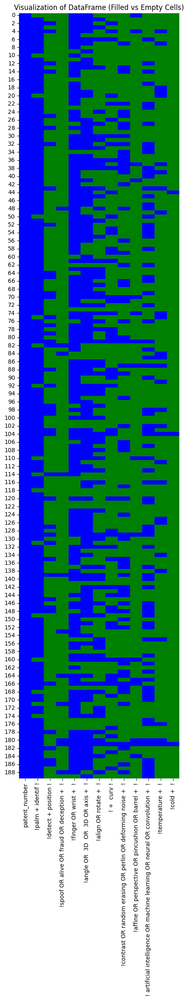

In [109]:
# Generate a heatmap with seaborn
plt.figure(figsize=(5, 24))
sns.heatmap(novelty_analysis_df_nan.isnull(), cmap=['blue', 'green'], cbar=False)
plt.title('Visualization of DataFrame (Filled vs Empty Cells)')
plt.show()

In [110]:
novelty_analysis_df

,patent_number,!palm + identif !,!detect + position !,!spoof OR alive OR fraud OR deception + !,!finger OR wrist + !,!angle OR 3D OR 3D OR axis + !,!align OR rotate + !,! + curv !,!contrast OR random erasing OR perlin OR deforming noise + !,!affine OR perspective OR pincushion OR barrel + !,! artificial intelligence OR machine learning OR neural OR convolution + !,!temperature + !,!cold + !
0,CN106980828B,,,,"For example, deviations may occur when there i...",taking the first average point as a circle cen...,,,,"From the practical operation PERSPECTIVE, when...",,,
1,CN113033429A,PALM and PALM type PALM vein feature extractio...,,,"At present, most of door locks or access contr...","step 4, forming a QUADRANGLE by the four valle...",It should be noted that: fs represents a PALM-...,,,,,,
2,WO2023174317A1,本申请涉及手掌生物特征识别领域，特别是指一种手掌生物特征采集方法、装置、存储介质及设备。Th...,为解决现有技术的缺陷，本申请提供一种手掌生物特征采集方法、装置、存储介质及设备，能够有效判断...,,根据所述手掌轮廓，提取食指与中指间指缝的交叉点以及无名指与小指间指缝的交叉点作为两个关键点；...,"If the PALM is placed at an ANGLE, the deforma...",,在一些实施例中，所述光斑的中心点通过如下步骤得到：将所述光斑作为圆进行曲线拟合，将拟合的圆的...,,,,,
3,CN111160290A,PALM vein IDENTIFICATION is a new biological c...,,,PALM vein IDENTIFICATION is a new biological c...,"Further, in step S3, the middle FINGER straigh...",The image area calibration of step S3 is a ste...,,,,,,
4,CN107066988A,A kind of PALM infrared body TEMPERATURE measu...,The present embodiment is high flow capacity c...,,Corresponding card and reading IDENTIFYING dev...,The approximate translation invariance having ...,,"Preferably, described infrared thermopile indu...",,"For matching double points, stochastical sampl...",,A kind of PALM infrared body TEMPERATURE measu...,
...,...,...,...,...,...,...,...,...,...,...,...,...,...
185,CN107944356A,The invention belongs to the field of PALM pri...,(1a) Line feature extraction: extracting the l...,,The most widely applied biometric IDENTIFICATI...,"step 1b 1 Calculating pixel point x c,r Intere...",,,,,Compared with the traditional authentication m...,,
186,CN107239772A,The present invention relates to biometrics ID...,The edge according to visible ray PALM image D...,,Existing self-service clearance gate system ma...,By Q1And Q2In be linked to be line segment clo...,,,"The service life of equipment, it is plane to ...",,"Feature extraction unit, the characteristic ve...",,
187,WO2004111919A1,METHOD OF PALM PRINT IDENTIFICATION.\nThe inve...,,,The most widely used biometric feature is the ...,"Preferably, the geometrical features parameter...",,of some short lines and the line segments whos...,,,where the rs sum is over all pixels within a s...,,
188,US11721132B1,"Second, to DETECT the liveness of a PALM, a re...",,If the biometric evidence presented for authen...,"For example, almost all smart phones nowadays ...",,"For example, down sampling may first be applie...",,", machine learning based on training data spec...",,6A depicts an exemplary high level system diag...,,


In [111]:
novelty_analysis_df.to_csv('/content/novelty.csv')

In [112]:
  for iter in filter_data:
    print(iter)
    #print(iter['target_words_or'], ',', iter['target_words_and'])
    target_parts = get_sentenses_with_terms(re.split(r'[.\n]', novelty_df.description.values[0]), iter['target_words_or'], iter['target_words_and'])
    #print(target_parts)
    print()
    patent_line = [novelty_df['patent number'][3]] + [target_parts]
    #print(patent_line)


{'target_words_or': 'palm', 'target_words_and': 'identif'}

{'target_words_or': 'detect', 'target_words_and': 'position'}

{'target_words_or': 'spoof OR alive OR fraud OR deception', 'target_words_and': ''}

{'target_words_or': 'finger OR wrist', 'target_words_and': ''}

{'target_words_or': 'angle OR  3D  OR  3D OR axis', 'target_words_and': ''}

{'target_words_or': 'align OR rotate', 'target_words_and': ''}

{'target_words_or': '', 'target_words_and': ' curv'}

{'target_words_or': 'contrast OR random erasing OR perlin OR deforming noise', 'target_words_and': ''}

{'target_words_or': 'affine OR perspective OR pincushion OR barrel', 'target_words_and': ''}

{'target_words_or': ' artificial intelligence OR machine learning OR neural OR convolution', 'target_words_and': ''}

{'target_words_or': 'temperature', 'target_words_and': ''}

{'target_words_or': 'cold', 'target_words_and': ''}



In [113]:
patent_lines

[['CN106980828B',
  '',
  '',
  '',
  'For example, deviations may occur when there is a slight depression in the edge of a FINGER or PALM (of course not as large as the depression between two FINGERS).\nIn a sense, these indentation points represent a depression between two FINGERS.\n',
  'taking the first average point as a circle center, taking the set threshold as a radius to make a circle, and selecting one point at intervals of a set ANGLE on the obtained circumference to obtain a plurality of selected points;.\na selection point acquisition module: the circle is made by taking the first average point as the circle center and the set threshold value as the radius, and one point is selected at intervals of a set ANGLE on the obtained circumference to obtain a plurality of selected points;.\n2, the circle is denoted by a), and one point is selected at every set ANGLE on the obtained circle, so as to obtain a plurality of selected points (in fig.\nThe setting ANGLE in this embodimen

# tests part


In [114]:
url = 'https://patents.google.com/patent/CN206879437U/en?oq=CN206879437U'
options = Options()
options.add_argument("--headless")
options.add_argument('--no-sandbox')
options.add_argument('--user-agent=Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/92.0.4515.131 Safari/537.36')
driver = webdriver.Chrome(options=options)
driver.get(url)
WebDriverWait(driver, 20).until(ec.visibility_of_element_located((By.ID, 'content')))
soup = BeautifulSoup(driver.page_source, 'lxml')


In [115]:
soup.text

'\nCN206879437U - The caterpillar band self-propelled efficiently selected cropper of medicinal material \n        - Google Patents\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\xa0Patents\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n      Include patents\n    \n\n\n\n\n\n\n      Include non-patent literature\n    \n\n\n\n\n\n\n\n\n        Search within\n        \n\n\n\nSearch within the title, abstract, claims, or full patent document: You can\n          restrict your search to a specific field using field names.\nUse TI= to search in the title, AB= for the\n          abstract, CL= for the claims, or TAC= for\n          all three. For example, TI=(safety belt).\n        \nSearch by Cooperative Patent Classifications (CPCs): These are commonly used to\n          represent ideas in place of keywords, and can also be entered in a search term box. If\n          you\'re searching forseat belts, you could also search for\n          B60R22/00 to retrieve doc

In [116]:
claims = soup.find('section', id='claims').text.strip()
print(claims)

Claims (10)

                      Hide Dependent 






translated from 











 
1. a kind of caterpillar band self-propelled efficiently selected cropper of medicinal material, including cropper body and seized with what cropper body was connected
Device and grating annular elevator（7）, a running gear is also associated with cropper body（9）, the device of seizing is located at institute
State running gear（9）The front end of direct of travel；
It is characterized in that：
The device of seizing passes through multistage transmission screening plant and grating annular elevator（7）It is connected；
The multistage transmission screening plant includes the one-level transmission screening plant being sequentially connected（5）, two level transmission screening plant
（17）And three-level transmission screening plant（6）, the one-level transmission screening plant（5）Screening plant is transmitted with two level（17）Non- work
Make to be respectively arranged with several moving seesaw-type jum

In [117]:
description = soup.find('section', id='description').text.strip()
print(description)

Description
translated from 










The caterpillar band self-propelled efficiently selected cropper of medicinal material

Technical field
The utility model relates generally to the Chinese medicine for the lower small particles of soil（Such as corydalis tuber, the tuber of pinellia, Southern Star class）Machinery
Excavate, sorting harvesting technique field, and in particular to crawler type walks the selected cropper of efficient medicinal material certainly.


Background technology
Corydalis tuber main producing region is in Shaanxi, Zhejiang, Hebei, the Three Eastern Provinces, Henan, Shandong, Shanxi, Jiangsu, Anhui annual 4-5 months
Harvesting；Tuber of pinellia main producing region Yunnan, Guizhou, Sichuan, Shandong, Gansu, Hubei, Anhui, Shaanxi, Shanxi and the whole nation based on southwest
Producing region, yield account for 60% or so of the whole nation, and the tuber of pinellia plants receipts twice, harvests the collecting season 6-7 months and harvest once a 8-9 month

In [118]:
get_data_from_google_patent(url, 'US')

other_apps CN206879437U,
url is not changed since no US, EP, WO is detected https://patents.google.com/patent/CN206879437U/en?oq=CN206879437U


(['CN206879437U',
  'CN201720675785.1U',
  'The caterpillar band self-propelled efficiently selected cropper of medicinal material',
  'CN201720675785.1U;',
  '2017-06-12',
  'Individual;',
  '张东军;',
  '2018-01-16',
  'no_data',
  "Claims (10)                      Hide Dependent translated from  1. a kind of caterpillar band self-propelled efficiently selected cropper of medicinal material, including cropper body and seized with what cropper body was connectedDevice and grating annular elevator（7）, a running gear is also associated with cropper body（9）, the device of seizing is located at instituteState running gear（9）The front end of direct of travel；It is characterized in that：The device of seizing passes through multistage transmission screening plant and grating annular elevator（7）It is connected；The multistage transmission screening plant includes the one-level transmission screening plant being sequentially connected（5）, two level transmission screening plant（17）And three-level t

In [119]:
a =[['Publication number', 'Priority date', 'Publication date', 'Assignee', 'Title'], ['CN107018742A', '2017-06-12', '2017-08-08', '张东军', 'The caterpillar band self-propelled selected cropper of efficient medicinal material'], ['CN108293331A', '2018-04-12', '2018-07-20', '新乡地隆药业机械有限公司', 'Self-propelled little particle root crop harvester'], ['CN108325620A', '2018-02-25', '2018-07-27', '大连高新区丰申进出口有限公司', 'A kind of biomass fuel material processing device'], ['CN108371987A', '2018-02-25', '2018-08-07', '大连高新区丰申进出口有限公司', 'A kind of biomass fuel processing equipment'], ['CN108372019A', '2018-02-25', '2018-08-07', '大连高新区丰申进出口有限公司', 'A kind of biomass fuel processing structure'], ['CN108464102A', '2018-04-12', '2018-08-31', '新乡地隆药业机械有限公司', 'Little particle root crop screening plant'], ['CN108483040A', '2018-04-03', '2018-09-04', '曾正扬', 'A kind of crawler-belt type full-automatic steel pipe picking, cleaning classifying packing device'], ['CN110024546A', '2019-04-22', '2019-07-19', '中国矿业大学', 'A kind of fritillaria thunbergii cropper'], ['Family To Family Citations', '', '', '', ''], ['Publication', 'no_data', 'Publication Date', 'no_data', 'Title'], ['CN206879437U', 'no_data', '2018-01-16', 'no_data', 'The caterpillar band self-propelled efficiently selected cropper of medicinal material'], ['CN107018742A', 'no_data', '2017-08-08', 'no_data', 'The caterpillar band self-propelled selected cropper of efficient medicinal material'], ['CN106416597B', 'no_data', '2019-01-29', 'no_data', 'Towed straw chopping and returning incomplete film-recovering machine'], ['CN213368556U', 'no_data', '2021-06-08', 'no_data', 'Agricultural device for improving soil in agriculture'], ['CN110024546B', 'no_data', '2021-05-25', 'no_data', 'Thunberg fritillary bulb harvester'], ['CN106068879B', 'no_data', '2017-11-03', 'no_data', 'Self-propelled shallow rootstalk combine'], ['CN103444473A', 'no_data', '2013-12-18', 'no_data', 'Residual mulching film recovering method and recovering machine set'], ['CN208445969U', 'no_data', '2019-02-01', 'no_data', 'Stone collector, root crop harvest all-in-one machine'], ['CN107711034A', 'no_data', '2018-02-23', 'no_data', 'A kind of towed cyperue esculentus cropper'], ['CN107801470A', 'no_data', '2018-03-16', 'no_data', 'A kind of greenhouse pseudo-ginseng cropper'], ['CN105075488A', 'no_data', '2015-11-25', 'no_data', 'Suspension type combine harvester'], ['CN210247534U', 'no_data', '2020-04-07', 'no_data', 'Rearmounted trailing formula medicinal material harvester'], ['CN107278390A', 'no_data', '2017-10-24', 'no_data', 'One kind arable land flattening device'], ['CN105532160B', 'no_data', '2017-10-13', 'no_data', 'The self-propelled selected cropper of efficient corydalis tuber'], ['CN108432373A', 'no_data', '2018-08-24', 'no_data', 'A kind of novel miscellaneous grave mound slot and grave mound machine clearly'], ['CN105612903B', 'no_data', '2018-02-02', 'no_data', 'Chinese artichoke makes stalk cropper'], ['CN205005483U', 'no_data', '2016-02-03', 'no_data', 'Potato takes off native harvester'], ['CN205794077U', 'no_data', '2016-12-14', 'no_data', 'Herbvore silkworm cropper'], ['CN106068882B', 'no_data', '2017-11-03', 'no_data', 'self-propelled peanut combine'], ['CN113079806A', 'no_data', '2021-07-09', 'no_data', 'Backpack crawler cyperus esculentus harvester'], ['CN105532127B', 'no_data', '2017-06-27', 'no_data', 'One kind trench digging, fertilization all-in-one machine'], ['CN205146419U', 'no_data', '2016-04-13', 'no_data', 'All -in -one is handled to fertilizer'], ['CN209710718U', 'no_data', '2019-12-03', 'no_data', 'One seedling stem block excavator'], ['CN104350870A', 'no_data', '2015-02-18', 'no_data', 'Mandulapalka harvester with two-layer stationary screen'], ['CN208863123U', 'no_data', '2019-05-17', 'no_data', 'A kind of novel miscellaneous grave mound slot and grave mound machine clearly'], ['Application', 'Priority date', 'Filing date', 'Title'], ['CN201720675785.1U', '2017-06-12', '2017-06-12', 'The caterpillar band self-propelled efficiently selected cropper of medicinal material']]
a

[['Publication number',
  'Priority date',
  'Publication date',
  'Assignee',
  'Title'],
 ['CN107018742A',
  '2017-06-12',
  '2017-08-08',
  '张东军',
  'The caterpillar band self-propelled selected cropper of efficient medicinal material'],
 ['CN108293331A',
  '2018-04-12',
  '2018-07-20',
  '新乡地隆药业机械有限公司',
  'Self-propelled little particle root crop harvester'],
 ['CN108325620A',
  '2018-02-25',
  '2018-07-27',
  '大连高新区丰申进出口有限公司',
  'A kind of biomass fuel material processing device'],
 ['CN108371987A',
  '2018-02-25',
  '2018-08-07',
  '大连高新区丰申进出口有限公司',
  'A kind of biomass fuel processing equipment'],
 ['CN108372019A',
  '2018-02-25',
  '2018-08-07',
  '大连高新区丰申进出口有限公司',
  'A kind of biomass fuel processing structure'],
 ['CN108464102A',
  '2018-04-12',
  '2018-08-31',
  '新乡地隆药业机械有限公司',
  'Little particle root crop screening plant'],
 ['CN108483040A',
  '2018-04-03',
  '2018-09-04',
  '曾正扬',
  'A kind of crawler-belt type full-automatic steel pipe picking, cleaning classifying packin